# Double Pendulum: Theory, code, simulations, results

This is a term paper on the double pendulum for the course on Non-Linear Dynamics (IDC402). I have chosen this as a model because of its diversenes relative to how simple the actual system is. It is just a simple pendulum attached to another pendulum. I have done some tweaks to it. I have recorded some interesting states.

## Theory

<img src="double_pendulum.png" width="300" height="300">

Let's say we have a double pendulum with pendulums of lengths $l_1$ and $l_2$, with masses $m_1$ and $m_2$. Let's say the angles that they make with the vertical axis are $\theta_1$ and $\theta_2$.  The lagrangian of the system is 

$$\mathcal{L}=T-V$$

To find this, we need the kinetic and the potential energy equations. So we take the position coordinates of the two masses.

$$
\begin{aligned}
    x_1 &= l_1 \sin \theta_1 \\
    x_2 &= l_1 \sin \theta_1 + l_2 \sin \theta_2 \\
    y_1 &= -l_1 \cos \theta_1 \\
    y_2 &= -l_1 \cos \theta_1 - l_2 \cos \theta_2
\end{aligned}
$$

taking the first derivatice gives velocity and we can get $T$ and $U$ from this accordingly. The kinetic energy will be

$$
\begin{aligned}
    T &= \frac{1}{2} m_1 v_1^2 + \frac{1}{2} m_2 v_2^2 \\
      &= \frac{1}{2} m_1 (\dot{x}_1^2 + \dot{y}_1^2) + \frac{1}{2} m_2 (\dot{x}_2^2 + \dot{y}_2^2) \\
      &= \frac{1}{2} m_1 l_1^2 \dot{\theta}_1^2 + \frac{1}{2} m_2 \left[ l_1^2 \dot{\theta}_1^2 + l_2^2 \dot{\theta}_2^2 + 2 l_1 l_2 \dot{\theta}_1 \dot{\theta}_2 \cos(\theta_1 - \theta_2) \right]
\end{aligned}
$$

and the potential energy will be

$$
\begin{aligned}
    V &= m_1 g y_1 + m_2 g y_2 \\
      &= -m_1 g l_1 \cos \theta_1 - m_2 g \left( l_1 \cos \theta_1 + l_2 \cos \theta_2 \right) \\
      &= -(m_1 + m_2) g l_1 \cos \theta_1 - m_2 g l_2 \cos \theta_2
\end{aligned}
$$

Which gives us the lagrangian,
$$\mathcal{L} = \left[\frac{1}{2}(m_1+m_2)L_1^2\dot{\phi_1}^2 + m_2L_1L_2\dot{\phi_1}\dot{\phi_2}\cos{(\phi_1-\phi_2)} + \frac{1}{2}m_2L_2^2\dot{\phi_2}^2\right]- \left[(m_1+m_2)gL_1(\cos{\phi_1}-1) + m_2gL_2(cos{\phi_2}-1)\right]$$


the derivatives are
$$
\frac{\partial L}{\partial \theta_1} = -m_2 l_1 l_2 \dot{\theta}_1 \dot{\theta}_2 \sin(\theta_1 - \theta_2) - (m_1 + m_2) g l_1 \sin \theta_1
$$

and

$$
\frac{\partial L}{\partial \theta_2} = m_2 l_1 l_2 \dot{\theta}_1 \dot{\theta}_2 \sin(\theta_1 - \theta_2) - m_2 g l_2 \sin \theta_2
$$

Now substituting this into the Euler Lagrange equation given by

$$
\frac{d}{dt} \left( \frac{\partial L}{\partial \dot{\theta}_i} \right) - \frac{\partial L}{\partial \theta_i} = 0,
$$

gives us the two coupled second-order nonlinear equations from


$$
(m_1 + m_2) l_1 \ddot{\theta}_1 + m_2 l_2 \ddot{\theta}_2 \cos(\theta_1 - \theta_2) + m_2 l_2 \dot{\theta}_2^2 \sin(\theta_1 - \theta_2) + (m_1 + m_2) g \sin \theta_1 = 0
$$

$$
l_2 \ddot{\theta}_2 + l_1 \ddot{\theta}_1 \cos(\theta_1 - \theta_2) - l_1 \dot{\theta}_1^2 \sin(\theta_1 - \theta_2) + g \sin \theta_2 = 0
$$
on simplifying,

$$
\ddot{\theta}_1 + \alpha_1(\theta_1, \theta_2) \ddot{\theta}_2 = f_1(\theta_1, \theta_2, \dot{\theta}_1, \dot{\theta}_2)
$$


$$
\ddot{\theta}_2 + \alpha_2(\theta_1, \theta_2) \ddot{\theta}_1 = f_2(\theta_1, \theta_2, \dot{\theta}_1, \dot{\theta}_2)
$$

where the $\alpha_i$ and $f_i$ are given by


$$
\alpha_1(\theta_1, \theta_2) := \frac{l_2}{l_1} \left(\frac{m_2}{m_1 + m_2}\right) \cos(\theta_1 - \theta_2)
$$

$$
\alpha_2(\theta_1, \theta_2) := \frac{l_1}{l_2} \cos(\theta_1 - \theta_2)
$$


$$
f_1(\theta_1, \theta_2, \dot{\theta}_1, \dot{\theta}_2) := - \frac{l_2}{l_1} \left( \frac{m_2}{m_1 + m_2} \right) \dot{\theta}_2^2 \sin(\theta_1 - \theta_2) - \frac{g}{l_1} \sin \theta_1
$$

$$
f_2(\theta_1, \theta_2, \dot{\theta}_1, \dot{\theta}_2) := \frac{l_1}{l_2} \dot{\theta}_1^2 \sin(\theta_1 - \theta_2) - \frac{g}{l_2} \sin \theta_2
$$

Clearly, this can be written as a 2 x 2 matrix and the angles will be given by

$$\ddot \theta_1 = \frac{1}{1-\alpha_1\alpha_2} (f_1-f_2\alpha_1)=g_1(\theta_1,\theta_2,\omega_1,\omega_2)$$

$$\ddot \theta_2 = \frac{1}{1-\alpha_1\alpha_2} (f_2-f_1\alpha_2)=g_2(\theta_1,\theta_2,\omega_1,\omega_2)$$

where $\omega_1=\dot\theta_1$ and $\omega_2=\dot\theta_2$

In [26]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.animation as animation

from matplotlib import animation, rc
from IPython.display import HTML

plt.rcParams["animation.html"] = "jshtml"


In [27]:
# initial conditionss
g = 9.81 
l1, l2 = 1.0, 1.0
m1, m2 = 1.0, 1.0

# Time setup
dt = 0.01
T_max = 10
N = int(T_max / dt)
t = np.linspace(0, T_max, N)

y0 = np.radians([120, -10, 0, 0]) 

In [28]:
# definitions of the functions of theta, alpha and f

def alpha_1(theta_1,theta_2):
    alpha_1 = (l2/l1) * (m2/(m1+m2)) * np.cos(theta_1 - theta_2)
    return alpha_1

def alpha_2(theta_1,theta_2):
    alpha_2 = (l1/l2) * np.cos(theta_1 - theta_2)
    return alpha_2

def f1(theta_1,theta_2,w2):
    f1 = - (l2/l1) * (m2/(m1 + m2)) * (w2 ** 2) * np.sin(theta_1 - theta_2) - (g/l1) * np.sin(theta_1)
    return f1

def f2(theta_1,theta_2,w1):
    f2 = (l1/l2) * (w1 ** 2) * np.sin(theta_1-theta_2) - (g/l2) * np.sin(theta_2)
    return f2

# using Runge-Kutta of order 4

def RK_term(t, y, dt, f):

    k1 = dt * f(y,t)
    k2 = dt * f(y + 0.5 * k1, t + 0.5 * dt)
    k3 = dt * f(y + 0.5 * k2, t + 0.5 * dt)
    k4 = dt * f(y + k3, t + dt)

    RK_term = (1/6) * (k1 + 2 * k2 + 2 * k3 +k4)

    return RK_term

def domega(y, t):
    
    theta_1, theta_2, w1, w2 = y

    c = 1/(1 - (alpha_1(theta_1,theta_2) * alpha_2(theta_1,theta_2)))
    g1 = c * (f1(theta_1,theta_2,w2) - (alpha_1(theta_1,theta_2) * f2(theta_1,theta_2,w1)))
    g2 = c * (f2(theta_1,theta_2,w1) - (alpha_2(theta_1,theta_2) * f1(theta_1,theta_2,w2)))

    return np.array([w1,w2,g1,g2])

def T_energy(point):
    theta_1 = point[0]
    theta_2 = point[1]
    w1 = point[2]
    w2 = point[3]

    T = 0.5 * (m1 * (l1 ** 2) * (w1 ** 2) + m2 * (l1 ** 2) * (w1 ** 2) + m2 * (l2 ** 2) * (w2 ** 2)) + m2 * l1 * l2 * w1 * w2 * np.cos(theta_1 - theta_2)
    V = - (m1 + m2) * g * l1 * np.cos (theta_1) - m2 * g * l2 * np.cos (theta_2)

    T_energy = T + V

    return T_energy

def RK_4_DP():
    y=[y0]
    for i in range(1,N):
        y.append(y[i-1] + RK_term(t[i-1],y[i-1],dt,domega))
    for p in y:
        total_energy_rk = np.array([T_energy(p) for p in y])
    return y, total_energy_rk

def Euler_DP():
    y=[y0]
    for i in range(1,N):
        y.append(y[i - 1] + dt * domega(y[i - 1], t[i - 1]))
    for p in y:
        total_energy_eu = np.array([T_energy(p) for p in y])
    return y, total_energy_eu

In [29]:
# execution

rk_y, rk_E = RK_4_DP()
eu_y, eu_E = Euler_DP()

rk_E.shape, eu_E.shape

((1000,), (1000,))

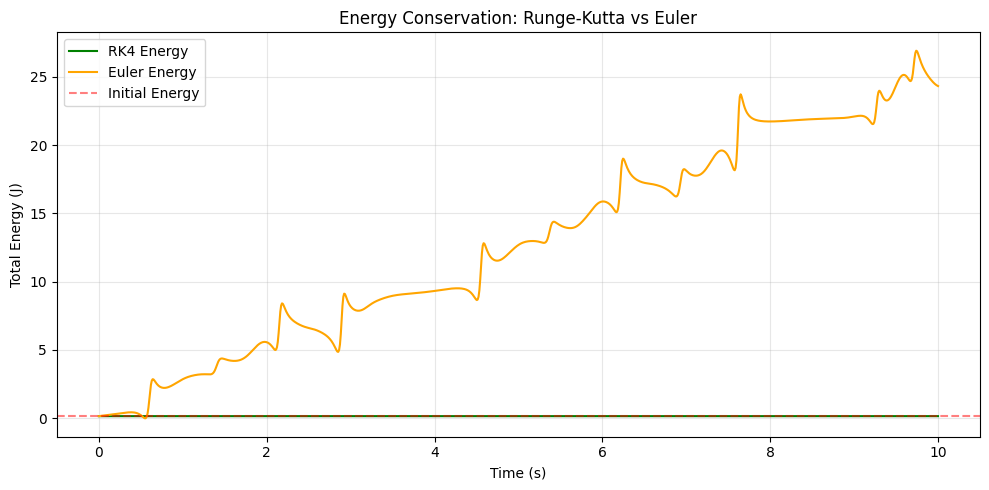

In [30]:
# Plot energy comparison between RK4 and Euler methods

plt.figure(figsize=(10, 5))
plt.plot(t, rk_E, label="RK4 Energy", color='green')
plt.plot(t, eu_E, label="Euler Energy", color='orange')
plt.axhline(rk_E[0], linestyle='--', color='red', alpha=0.5, label="Initial Energy")
plt.title("Energy Conservation: Runge-Kutta vs Euler")
plt.xlabel("Time (s)")
plt.ylabel("Total Energy (J)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

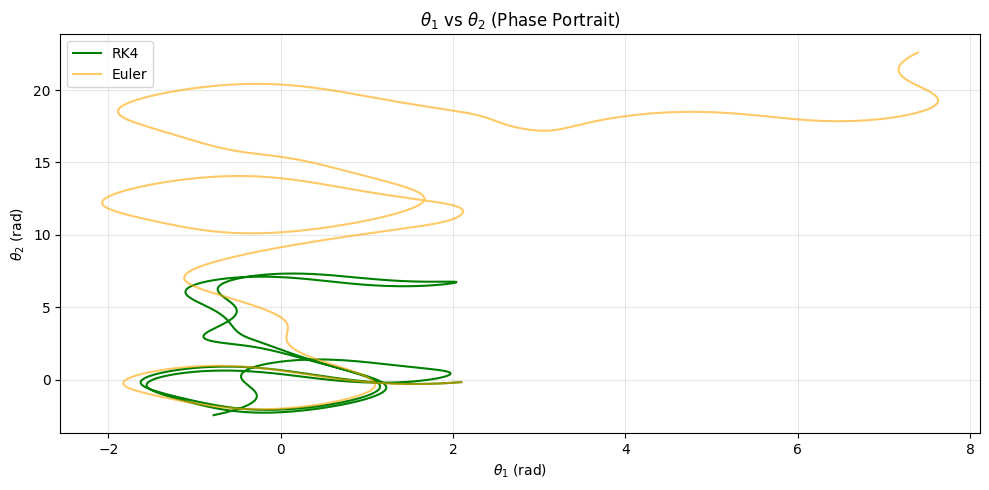

In [31]:
# Extract theta_1 and theta_2 from both RK4 and Euler simulations
rk_theta_1 = np.array([state[0] for state in rk_y])
rk_theta_2 = np.array([state[1] for state in rk_y])

eu_theta_1 = np.array([state[0] for state in eu_y])
eu_theta_2 = np.array([state[1] for state in eu_y])

# Plot theta_1 vs theta_2 for both methods
plt.figure(figsize=(10, 5))
plt.plot(rk_theta_1, rk_theta_2, label="RK4", color='green')
plt.plot(eu_theta_1, eu_theta_2, label="Euler", color='orange', alpha=0.6)
plt.title(r'$\theta_1$ vs $\theta_2$ (Phase Portrait)')
plt.xlabel(r'$\theta_1$ (rad)')
plt.ylabel(r'$\theta_2$ (rad)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


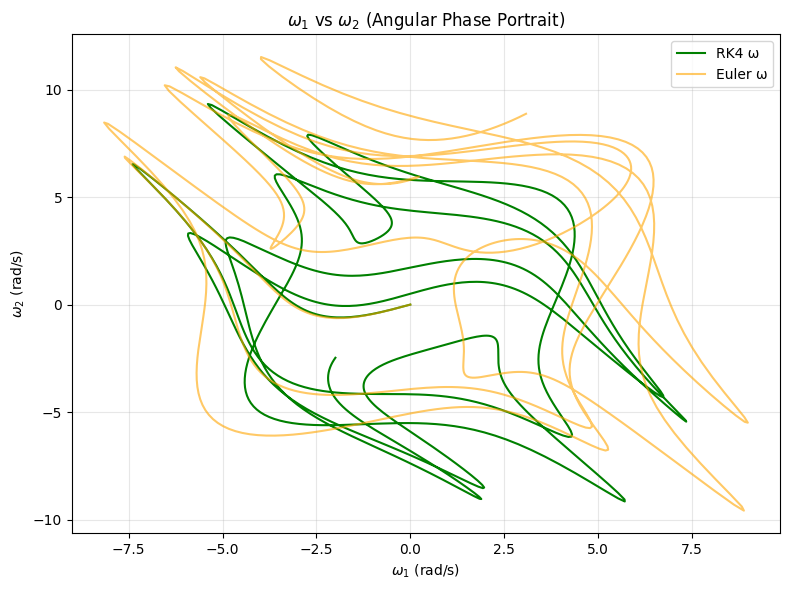

In [32]:
rk_omega_1 = np.array([state[2] for state in rk_y])
rk_omega_2 = np.array([state[3] for state in rk_y])
eu_omega_1 = np.array([state[2] for state in eu_y])
eu_omega_2 = np.array([state[3] for state in eu_y])

plt.figure(figsize=(8,6))
plt.plot(rk_omega_1, rk_omega_2, label="RK4 ω", color='green')
plt.plot(eu_omega_1, eu_omega_2, label="Euler ω", color='orange', alpha=0.6)
plt.title(r'$\omega_1$ vs $\omega_2$ (Angular Phase Portrait)')
plt.xlabel(r'$\omega_1$ (rad/s)')
plt.ylabel(r'$\omega_2$ (rad/s)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


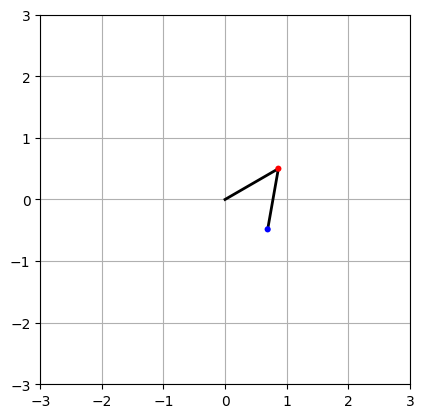

In [33]:
# Extract angular positions from RK4 results
theta_1 = np.array([state[0] for state in rk_y])
theta_2 = np.array([state[1] for state in rk_y])

def get_double_pendulum_coords(theta1, theta2):
    """Return x1, y1, x2, y2 for the double pendulum."""
    x1 = l1 * np.sin(theta1)
    y1 = -l1 * np.cos(theta1)
    x2 = x1 + l2 * np.sin(theta2)
    y2 = y1 - l2 * np.cos(theta2)
    return x1, y1, x2, y2

# Setup figure
fig, ax = plt.subplots()
x1_0, y1_0, x2_0, y2_0 = get_double_pendulum_coords(theta_1[0], theta_2[0])

line, = ax.plot([0, x1_0, x2_0], [0, y1_0, y2_0], lw=2, c='k')
bob1 = ax.add_patch(plt.Circle((x1_0, y1_0), 0.05, fc='r', zorder=3))
bob2 = ax.add_patch(plt.Circle((x2_0, y2_0), 0.05, fc='b', zorder=3))

ax.set_xlim(-1.5*(l1+l2), 1.5*(l1+l2))
ax.set_ylim(-1.5*(l1+l2), 1.5*(l1+l2))
ax.set_aspect('equal')
ax.grid(True)

def animate(i):
    x1, y1, x2, y2 = get_double_pendulum_coords(theta_1[i], theta_2[i])
    line.set_data([0, x1, x2], [0, y1, y2])
    bob1.set_center((x1, y1))
    bob2.set_center((x2, y2))
    return line, bob1, bob2

ani = animation.FuncAnimation(fig, animate, frames=len(theta_1), interval=dt*1000)


In [34]:
# to see butterfly effect, I wil now add an input initial condition for RK_4

def RK_4_ini(y0_ini=None):
    if y0_ini is None:
        y0_ini = y0

    y = [y0_ini]
    for i in range(1,N):
        y.append(y[i-1]+RK_term(t[i-1], y[i - 1], dt, domega))
    return y, np.array([T_energy(p) for p in y])

In [35]:
# Slight variation in initial angle
y0_a = np.radians([120, -10, 0, 0])
y0_b = np.radians([122.0001, -10, 0, 0])

rk_y_a, _ = RK_4_ini(y0_a)
rk_y_b, _ = RK_4_ini(y0_b)


theta1_a = np.array([s[0] for s in rk_y_a])
theta2_a = np.array([s[1] for s in rk_y_a])
theta1_b = np.array([s[0] for s in rk_y_b])
theta2_b = np.array([s[1] for s in rk_y_b])



In [36]:

def animate_double_pendulum_dual(theta1_a, theta2_a, theta1_b, theta2_b, l1=2.5, l2=2.5, dt=0.01):
    def get_coords(th1, th2):
        x1 = l1 * np.sin(th1)
        y1 = -l1 * np.cos(th1)
        x2 = x1 + l2 * np.sin(th2)
        y2 = y1 - l2 * np.cos(th2)
        return x1, y1, x2, y2

    fig, ax = plt.subplots()
    ax.set_xlim(-1.5*(l1+l2), 1.5*(l1+l2))
    ax.set_ylim(-1.5*(l1+l2), 1.5*(l1+l2))
    ax.set_aspect('equal')
    ax.grid(True)

    # Pendulum A (red)
    x1a, y1a, x2a, y2a = get_coords(theta1_a[0], theta2_a[0])
    line_a, = ax.plot([0, x1a, x2a], [0, y1a, y2a], 'r-', lw=2, label="Initial θ₁ = 120°")
    bob1_a = ax.add_patch(plt.Circle((x1a, y1a), 0.03, fc='r'))
    bob2_a = ax.add_patch(plt.Circle((x2a, y2a), 0.03, fc='darkred'))

    # Pendulum B (blue)
    x1b, y1b, x2b, y2b = get_coords(theta1_b[0], theta2_b[0])
    line_b, = ax.plot([0, x1b, x2b], [0, y1b, y2b], 'b-', lw=2, label="Initial θ₁ = 120.0001°")
    bob1_b = ax.add_patch(plt.Circle((x1b, y1b), 0.03, fc='blue'))
    bob2_b = ax.add_patch(plt.Circle((x2b, y2b), 0.03, fc='navy'))

    ax.legend()

    trail_a, = ax.plot([], [], 'r-', alpha=0.4, lw=1)
    trail_b, = ax.plot([], [], 'b-', alpha=0.4, lw=1)

    # Buffers to store tip paths
    trail_x_a, trail_y_a = [], []
    trail_x_b, trail_y_b = [], []


    def update(i):
        x1a, y1a, x2a, y2a = get_coords(theta1_a[i], theta2_a[i])
        line_a.set_data([0, x1a, x2a], [0, y1a, y2a])
        bob1_a.set_center((x1a, y1a))
        bob2_a.set_center((x2a, y2a))

        x1b, y1b, x2b, y2b = get_coords(theta1_b[i], theta2_b[i])
        line_b.set_data([0, x1b, x2b], [0, y1b, y2b])
        bob1_b.set_center((x1b, y1b))
        bob2_b.set_center((x2b, y2b))

        # Update trail for A
        trail_x_a.append(x2a)
        trail_y_a.append(y2a)
        trail_a.set_data(trail_x_a, trail_y_a)

        # Update trail for B
        trail_x_b.append(x2b)
        trail_y_b.append(y2b)
        trail_b.set_data(trail_x_b, trail_y_b)

        return line_a, bob1_a, bob2_a, line_b, bob1_b, bob2_b, trail_a, trail_b

       # return line_a, bob1_a, bob2_a, line_b, bob1_b, bob2_b

    ani = animation.FuncAnimation(fig, update, frames=len(theta1_a), interval=dt * 1000, blit=True)
    return ani


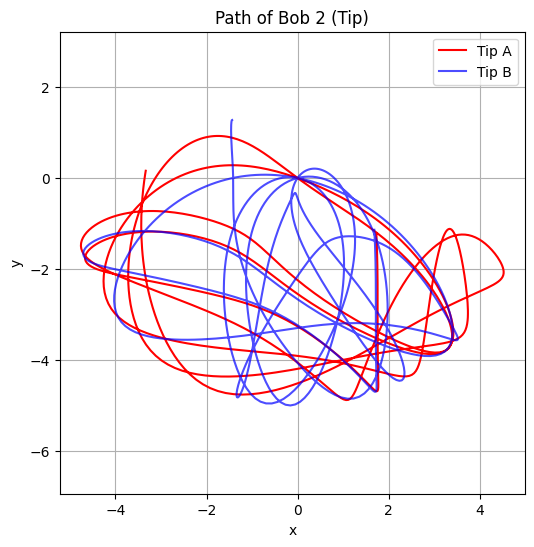

In [37]:
# Convert angles to Cartesian positions for the second bob
def get_tip_positions(theta1, theta2, l1=2.5, l2=2.5):
    x1 = l1 * np.sin(theta1)
    y1 = -l1 * np.cos(theta1)
    x2 = x1 + l2 * np.sin(theta2)
    y2 = y1 - l2 * np.cos(theta2)
    return x2, y2

x2a, y2a = get_tip_positions(theta1_a, theta2_a)
x2b, y2b = get_tip_positions(theta1_b, theta2_b)

# Plot tip paths
plt.figure(figsize=(6, 6))
plt.plot(x2a, y2a, label='Tip A', color='red')
plt.plot(x2b, y2b, label='Tip B', color='blue', alpha=0.7)
plt.xlabel('x')
plt.ylabel('y')
plt.title("Path of Bob 2 (Tip)")
plt.axis('equal')
plt.legend()
plt.grid(True)
plt.show()


In [38]:
# def animate_all_pendulums(x1_all, y1_all, x2_all, y2_all, dt=0.01, trail_length=20):
#     num_bobs, n_frames = x1_all.shape

#     fig, ax = plt.subplots(figsize=(8, 8))
#     ax.set_xlim(-1.5 * (l1 + l2), 1.5 * (l1 + l2))
#     ax.set_ylim(-1.5 * (l1 + l2), 1.5 * (l1 + l2))
#     ax.set_aspect('equal')
#     ax.set_title("Double Pendulum Chaos (100 Variants)")
#     ax.grid(True)

#     # Line and bob objects for each pendulum
#     lines = [ax.plot([], [], lw=1, color='gray', alpha=0.3)[0] for _ in range(num_bobs)]
#     bobs = [ax.plot([], [], 'o', color='black', markersize=3)[0] for _ in range(num_bobs)]

#     # Scatter plot for tips
#     tips = ax.scatter(x2_all[:, 0], y2_all[:, 0], s=8, c=np.linspace(0, 1, num_bobs), cmap='plasma')

#     # Optional: trail memory
#     trail_data = [([], []) for _ in range(num_bobs)]
#     trails = [ax.plot([], [], lw=0.5, color='red', alpha=0.5)[0] for _ in range(num_bobs)]

#     def update(i):
#         tip_coords = []
#         for b in range(num_bobs):
#             # Update pendulum arms
#             lines[b].set_data([0, x1_all[b, i], x2_all[b, i]],
#                               [0, y1_all[b, i], y2_all[b, i]])
#             bobs[b].set_data(x2_all[b, i], y2_all[b, i])

#             # Update tip for scatter
#             tip_coords.append([x2_all[b, i], y2_all[b, i]])

#             # Update trail
#             if i < trail_length:
#                 trail_data[b][0].append(x2_all[b, i])
#                 trail_data[b][1].append(y2_all[b, i])
#             else:
#                 trail_data[b][0] = trail_data[b][0][1:] + [x2_all[b, i]]
#                 trail_data[b][1] = trail_data[b][1][1:] + [y2_all[b, i]]
#             trails[b].set_data(trail_data[b][0], trail_data[b][1])

#         tips.set_offsets(tip_coords)
#         return lines + bobs + trails + [tips]

#     ani = animation.FuncAnimation(
#         fig, update, frames=n_frames, interval=dt * 1000, blit=True
#     )
#     return ani


# ani = animate_all_pendulums(x1_all, y1_all, x2_all, y2_all, dt=dt, trail_length=30)
# ani  # for inline Jupyter


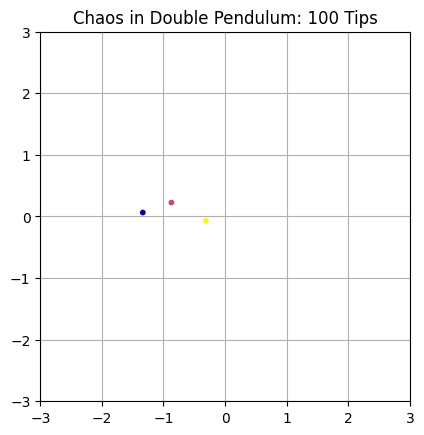

In [39]:
num_bobs = 3
theta1_vals = np.radians(np.linspace(120, 120.01, num_bobs))
theta2 = np.radians(-10)
w1, w2 = 0, 0

# Store positions
tip_x = []
tip_y = []

for theta1 in theta1_vals:
    y0_i = np.array([theta1, theta2, w1, w2])
    rk_y, _ = RK_4_ini(y0_i)
    theta1_arr = np.array([s[0] for s in rk_y])
    theta2_arr = np.array([s[1] for s in rk_y])
    # compute tip positions
    x1 = l1 * np.sin(theta1_arr)
    y1 = -l1 * np.cos(theta1_arr)
    x2 = x1 + l2 * np.sin(theta2_arr)
    y2 = y1 - l2 * np.cos(theta2_arr)
    tip_x.append(x2)
    tip_y.append(y2)

tip_x = np.array(tip_x)  # shape (100, N)
tip_y = np.array(tip_y)


def animate_tips(tip_x, tip_y, dt=0.01):
    num_bobs, n_frames = tip_x.shape
    fig, ax = plt.subplots()
    ax.set_xlim(-1.5 * (l1 + l2), 1.5 * (l1 + l2))
    ax.set_ylim(-1.5 * (l1 + l2), 1.5 * (l1 + l2))
    ax.set_aspect('equal')
    ax.set_title("Chaos in Double Pendulum: 100 Tips")
    ax.grid(True)

    # Create scatter plot for all bob tips
    scatter = ax.scatter(tip_x[:,0], tip_y[:,0], c=np.linspace(0, 1, num_bobs), cmap='plasma', s=10)

    def update(i):
        scatter.set_offsets(np.column_stack((tip_x[:, i], tip_y[:, i])))
        return scatter,

    ani = animation.FuncAnimation(fig, update, frames=n_frames, interval=dt*1000, blit=True)
    return ani


ani = animate_tips(tip_x, tip_y, dt=dt)
ani  # Jupyter will render this inline


In [40]:
def plot(t, y1, y2, y3):
    fig, axs = plt.subplots(3, 1, figsize=(8, 8))

    # Phi 1 plot
    axs[0].plot(t, y1)
    axs[0].set_title(r'$\phi_1$ vs Time', fontsize=12)
    axs[0].set_ylabel("Radians")

    # Phi 2 plot
    axs[1].plot(t, y2)
    axs[1].set_title(r'$\phi_2$ vs Time', fontsize=12)
    axs[1].set_ylabel("Radians")

    # Energy plot
    axs[2].plot(t, y3, label='Total Energy')
    axs[2].axhline(y3[0], linestyle="--", color='red', alpha=0.7, label='Initial Energy')
    axs[2].set_title('Energy Conservation', fontsize=12)
    axs[2].set_xlabel("Time (s)")
    axs[2].set_ylabel("Energy (J)")
    axs[2].ticklabel_format(axis='y', style='sci', scilimits=(0,0))
    axs[2].legend()

    # Universal settings
    for ax in axs:
        ax.grid(True, alpha=0.3)
        ax.set_xlim(t[0], t[-1])

    plt.tight_layout()
    plt.show()


# implement rk4

def RK_4(ani=False):

    y = [y0]

    for i in range(1,N):
        y.append(y[i-1] + RK_term(t[i-1], y[i-1], dt, domega))
    
    # for i in y:
    #     theta_1 = np.array(i[0])
    #     theta_2 = np.array(i[1])

    # for point in y:
    #     E = np.array(T_energy[point])

    theta_1 = np.array([i[0] for i in y])
    theta_2 = np.array([i[1] for i in y])

    # E = np.array(T_energy[point] for point in y)

    E = np.array([T_energy(point) for point in y])

    plot(t, theta_1, theta_2, E)

    if ani:
        xpos = np.array([
            [l1*np.sin(theta_1[i]), 
            l1*np.sin(theta_1[i]) + l2*np.sin(theta_2[i])] 
            for i in range(N)
        ])
        ypos = np.array([
            [-l1*np.cos(theta_1[i]), 
            -l1*np.cos(theta_1[i]) - l2*np.cos(theta_2[i])] 
            for i in range(N)
        ])

        return animate(xpos, ypos, title="...", name="...")

    return y, E

# using Euler's method

def Eu(y, f, t, dt):
    Eu = y + dt * f(y,t)

    return Eu


def Euler(ani=False):
    y = [y0]

    for i in range(1, N):
        y.append(Eu(y[i - 1], domega, t[i - 1], dt))

    # Convert y into proper arrays
    theta_1 = np.array([point[0] for point in y])
    theta_2 = np.array([point[1] for point in y])
    E = np.array([T_energy(point) for point in y])  # Compute E correctly

    # Ensure correct shapes before plotting
    print(f"Shapes - t: {t.shape}, theta_1: {theta_1.shape}, theta_2: {theta_2.shape}, E: {E.shape}")

    plot(t, theta_1, theta_2, E)  # Ensure all have same shape

    if ani:
        xpos = np.array([[l1 * np.sin(theta_1[i]), l1 * np.sin(theta_1[i]) + l2 * np.sin(theta_2[i])] for i in range(N)])
        ypos = np.array([[-l1 * np.cos(theta_1[i]), -(l1 * np.cos(theta_1[i]) + l2 * np.cos(theta_2[i]))] for i in range(N)])
        animate(xpos, ypos, title="Euler Method", name="euler_double_pendulum.gif")

    return y, E

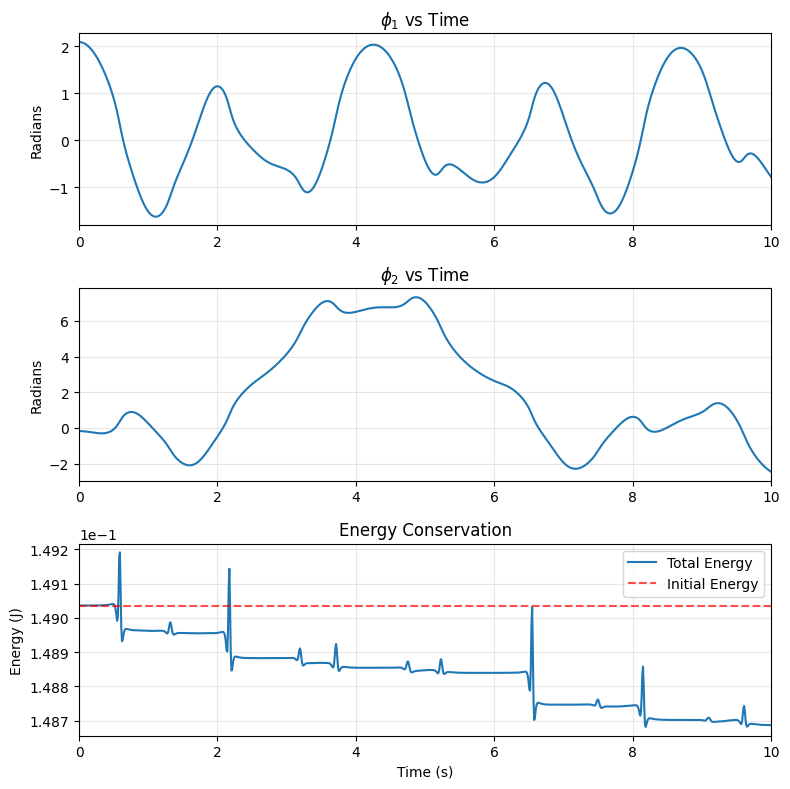

In [41]:
# Reduce the total simulation time for faster rendering
T = 10  # seconds
N = int(T / dt)
t = np.linspace(0, T, N)

RK4_plot_only = RK_4(ani=False)

yesss! andd


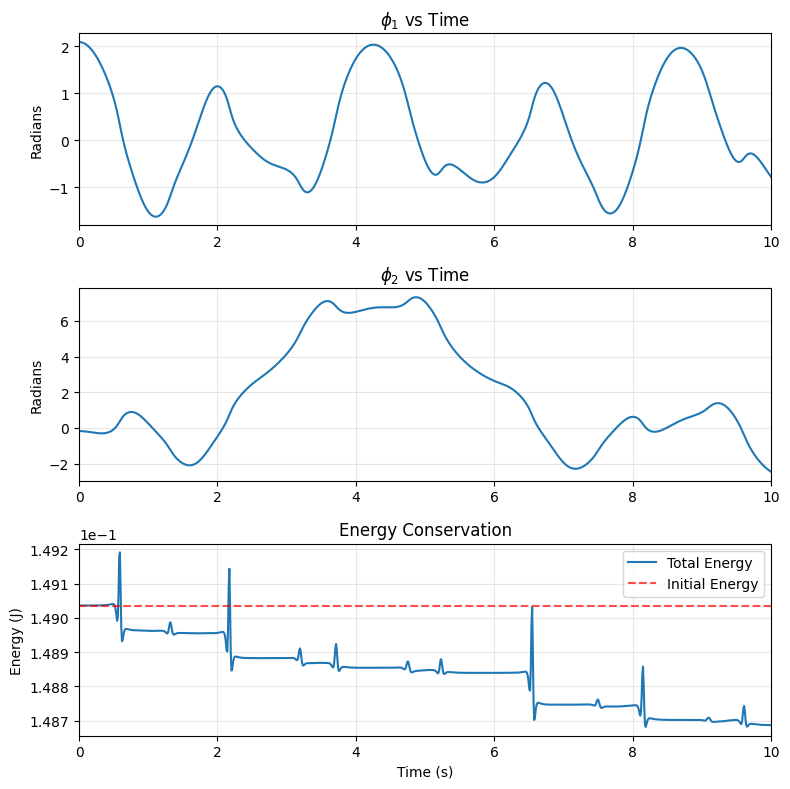

Shapes - t: (1000,), theta_1: (1000,), theta_2: (1000,), E: (1000,)


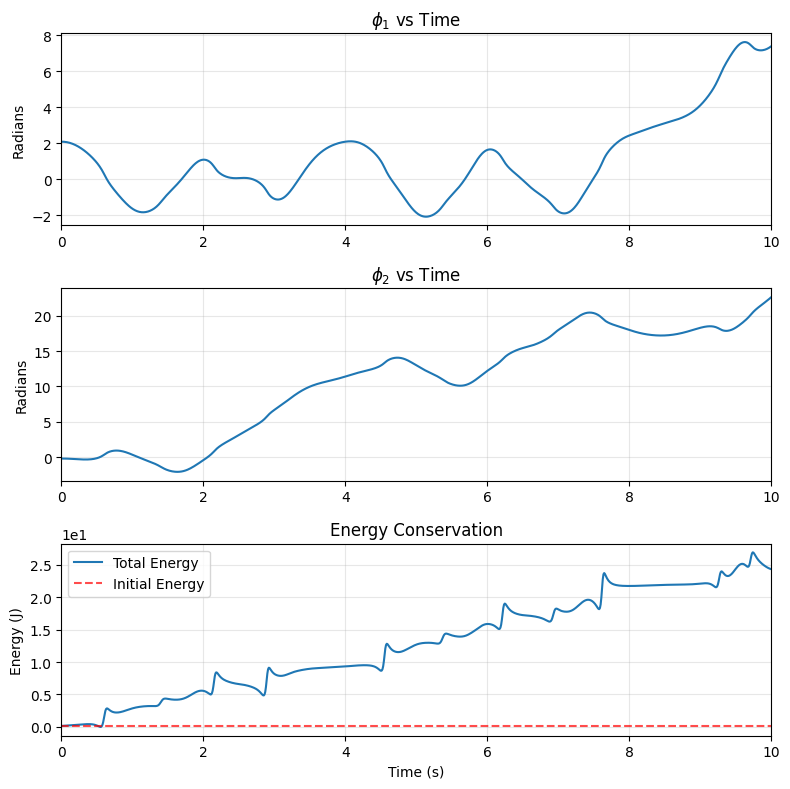

In [42]:
y_rk4, E_rk4 = RK_4(ani=False)  # For RK4 method
y_euler, E_euler = Euler(ani=False)  # For Euler method

In [43]:
# For RK4:
theta_1 = np.array([point[0] for point in y_rk4])
theta_2 = np.array([point[1] for point in y_rk4])
E = np.array([T_energy(point) for point in y_rk4])

# For Euler:
theta_1 = np.array([point[0] for point in y_euler])
theta_2 = np.array([point[1] for point in y_euler])
E = np.array([T_energy(point) for point in y_euler])


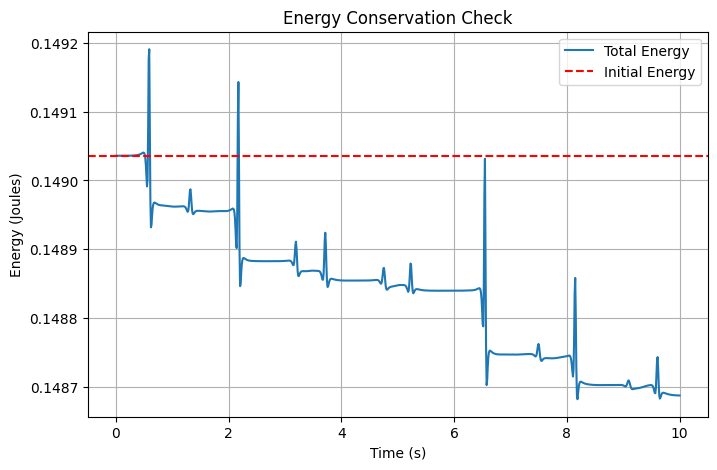

In [44]:
# Compute total energy at each timestep
E = np.array([T_energy(point) for point in y_rk4])


# Plot energy over time
plt.figure(figsize=(8, 5))
plt.plot(t, E, label="Total Energy")
plt.axhline(E[0], color='red', linestyle='--', label='Initial Energy')
plt.xlabel("Time (s)")
plt.ylabel("Energy (Joules)")
plt.title("Energy Conservation Check")
plt.legend()
plt.grid()
plt.show()

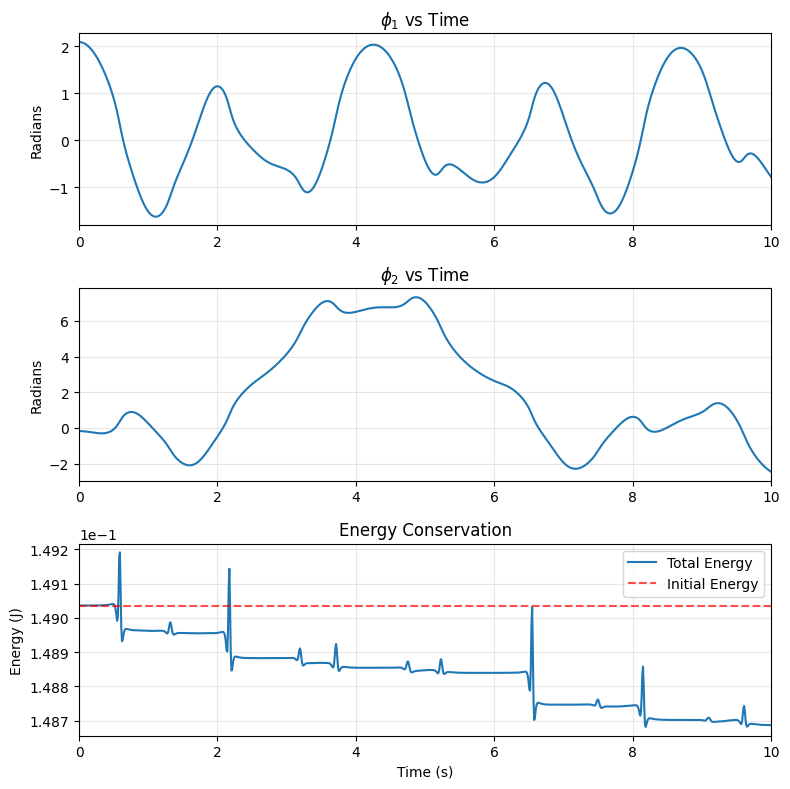

TypeError: animate() got an unexpected keyword argument 'title'

In [45]:
# rk simulation
E_rk = RK_4(ani=True)

In [ ]:
# Compute total energy at each timestep
E = np.array([T_energy(point) for point in y])  

# Plot energy over time
plt.figure(figsize=(8, 5))
plt.plot(t, E, label="Total Energy")
plt.axhline(E[0], color='red', linestyle='--', label='Initial Energy')
plt.xlabel("Time (s)")
plt.ylabel("Energy (Joules)")
plt.title("Energy Conservation Check")
plt.legend()
plt.grid()
plt.show()

NameError: name 'y' is not defined

In [ ]:
E_eu = Euler(ani=True)

In [ ]:
# plot residuals of energy for RK and Euler simulations
res_rk = E_rk-E0
res_eu = E_eu-E0

# Create a 2x1 grid of subplots, from chatGPT
fig, axs = plt.subplots(1, 1, figsize=(8, 6))

# plot both residuals
axs.plot(t, res_rk, label="RK4")
axs.plot(t, res_eu, label="Euler")
axs.set_title('Residuals')
axs.set_xlabel("t")
axs.legend()

In [ ]:
# constants for plotting
s1 = 100 * m1/(m1+m2)
s2 = 100 * m2/(m1+m2)

def update(i):
    plt.cla()
    # plot strings
    plt.plot([0,xpos[i][0]],[0,ypos[i][0]], marker = 'None', color='red')
    plt.plot(xpos[i], ypos[i], marker = 'None', color='blue')
    
    # plot masses
    plt.scatter(xpos[i][0], ypos[i][0], label='m1', color='red', marker='o', s=s1)
    plt.scatter(xpos[i][1], ypos[i][1], label='m2', color='blue', marker='o', s=s2)
    
    # set title and plot limits
    plt.title(f't = {i*dt:.2f}')
    plt.xlim(-(l1+l2), l1+l2)
    plt.ylim(-(l1+l2), l1+l2)
    plt.grid()

theta_1 = np.linspace(0, np.pi/6, N)
theta_2 = np.linspace(0, np.pi/6, N)

xpos = np.array([[l1 * np.sin(theta_1[i]), l1 * np.sin(theta_1[i]) + l2 * np.sin(theta_2[i])] for i in range(N)])
ypos = np.array([[-l1 * np.cos(theta_1[i]), -(l1 * np.cos(theta_1[i]) + l2 * np.cos(theta_2[i]))] for i in range(N)])

# initialize plot
fig = plt.figure()
# plot strings
plt.plot([0,xpos[0][0]],[0,ypos[0][0]], marker = 'None', color='red')
plt.plot(xpos[0], ypos[0], marker = 'None', color='blue')
# plot masses
plt.scatter(xpos[0][0], ypos[0][0], label='m1', color='red', marker='o', s=s1)
plt.scatter(xpos[0][1], ypos[0][1], label='m2', color='blue', marker='o', s=s2)
plt.xlim(-(l1+l2), l1+l2)
plt.ylim(-(l1+l2), l1+l2)
plt.grid()

ani = anim.FuncAnimation(fig, update, N, interval=dt*100)

# uncomment to save animation as a gif - must delete and recreate next cell to reload file
writergif = anim.PillowWriter(fps=1//dt)
ani.save("animation.gif", writer=writergif)


In [ ]:
# In RK_4 method:
xpos = np.array([
    [l1 * np.sin(theta_1[i]),  # First mass x
     l1 * np.sin(theta_1[i]) + l2 * np.sin(theta_2[i])]  # Second mass x
    for i in range(N)
])
ypos = np.array([
    [-l1 * np.cos(theta_1[i]),  # First mass y
     -l1 * np.cos(theta_1[i]) - l2 * np.cos(theta_2[i])]  # Second mass y
    for i in range(N)
])

# In Euler method (similar fix):
xpos = np.array([
    [l1 * np.sin(theta_1[i]),
     l1 * np.sin(theta_1[i]) + l2 * np.sin(theta_2[i])]
    for i in range(N)
])

def animate_pendulum(xpos, ypos, title):
    fig, ax = plt.subplots()
    ax.set_xlim(-2.2, 2.2)
    ax.set_ylim(-2.2, 2.2)
    ax.set_aspect('equal')
    
    # Initialize pendulum elements
    line, = ax.plot([], [], 'o-', lw=2)
    bob_radius = 0.1
    bob1 = ax.add_patch(plt.Circle((0,0), bob_radius, fc='r', zorder=3))
    bob2 = ax.add_patch(plt.Circle((0,0), bob_radius, fc='b', zorder=3))

    def animate(i):
        # Update pendulum arms
        x = [0, xpos[i][0], xpos[i][1]]
        y = [0, ypos[i][0], ypos[i][1]]
        line.set_data(x, y)
        
        # Update bob positions
        bob1.set_center((x[1], y[1]))
        bob2.set_center((x[2], y[2]))
        
        return line, bob1, bob2

    ani = animation.FuncAnimation(
        fig, animate, frames=len(xpos), 
        interval=dt*1000, blit=True
    )
    plt.close()
    return ani

# In RK_4 method:


# In Euler method:
if ani:
    return animate_pendulum(xpos, ypos, "Euler Method")

# Switch to notebook mode for interactive animations
%matplotlib notebook

# Run simulation with animation
ani = RK_4(ani=True)  # or Euler(ani=True)
ani


NameError: name 'np' is not defined

In [ ]:
%matplotlib notebook
import numpy as np
import matplotlib.pyplot as plt
from scipy.special import ellipk
from scipy.integrate import solve_ivp
import matplotlib.animation as animation

plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['figure.dpi'] = 100  

m, L, g = 1, 1, 9.81

iangle = -40
v0 = -0.2

theta0 = np.radians(iangle)

Tharm = 2 * np.pi * np.sqrt(L / g)
dt = 0.01

num_steps = 1000

def fun(t, y):
    p1 = y[0]
    p2 = y[1]

    dp1dt = p2
    dp2dt = -np.sin(p1)

    return [dp1dt, dp2dt]

#solve the system
U_0 = [np.radians(iangle), v0]
t_pts = np.linspace(0, 10*np.pi, num_steps)
result = solve_ivp(fun, (0, 10*np.pi), U_0, t_eval=t_pts,max_step=0.2,method='RK45')

nsteps = num_steps

def get_coords(th):
    """Return the (x, y) coordinates of the bob at angle th."""
    return L * np.sin(th), -L * np.cos(th)

# Initialize the animation plot. Make the aspect ratio equal so it looks right.
fig,ax = plt.subplots()

x0, y0 = get_coords(U_0[0])
line, = ax.plot([0, x0], [0, y0], lw=3, c='k')
bob_radius = 0.1
circle = ax.add_patch(plt.Circle(get_coords(U_0[0]), bob_radius,fc='r', zorder=3))
# Set the plot limits so that the pendulum has room to swing!
ax.set_xlim(-L*1.2, L*1.2)
ax.set_ylim(-L*1.2, L*1.2)

def animate(i):
    """Update the animation at frame i."""
    x, y = get_coords(result.y[0,i])
    line.set_data([0, x], [0, y])
    circle.set_center((x, y))

nframes = nsteps
interval = dt * nsteps
animation.FuncAnimation(fig, animate, frames=nframes,interval=interval)